# Python - Web Scraping

**Author:** Nina Rauscher

*Girls Who Code - Class 3 - Week 4 - 11/12/2023*

Today, we will learn **how to retrieve data from a web page based on the HTML code behind it**. After the [Billboard 200](https://www.billboard.com/charts/billboard-200/) example, it will be your turn to choose a web page and show us your work on our Slack channel!

## Prerequisites - HTML Basics

**HTML (Hypertext Markup Language)** is a web programming language that **provides the structure for creating web pages** by using a combination of *elements*, which are enclosed in *tags*.

**HTML tags** are used to define elements on a web page. They consist of **an opening tag (`<tag>`) and a closing tag (`</tag>`)** and enclose content.

**Elements** are **the building blocks of an HTML document** and can include headings (`<h1>` to `<h6>`), paragraphs (`<p>`), links (`<a>`), images (`<img>`), and more.

Besides, HTML elements can have *attributes* that provide additional information about the element. **Attributes are placed inside the opening tag** and are usually in the form of **name="value"**.

Finally, a basic HTML document typically includes a `<head>` section for metadata and a `<body>` section for the visible content. The `<html>` element encloses the entire document.

### Let's practice the basics of HTML!

When writing markdown in your notebook, you can use HTML to format it. Let's write some headings:

`<h4> Heading 4 </h4>` will thus print:

<h4> Heading 4 </h4>

Now, let's do our first ordered list (1, 2, 3, ...) using the tag `<ol>` and encapsulating our list inside it. For each element of the ordered list, we use the tag `<li>` to encapsulate the titles:

```
<ol>
  <li>First item</li>
  <li>Second item</li>
  <li>Third item</li>
</ol>
```

<ol>
  <li>First item</li>
  <li>Second item</li>
  <li>Third item</li>
</ol>

Likewise, let's do our first unordered list (bullet points) using the tag `<ul>` and encapsulating our list inside it. For each element of the ordered list, we use the tag `<li>` to encapsulate the titles:

```
<ul>
  <li>First item</li>
  <li>Second item</li>
  <li>Third item</li>
</ul>
```

<ul>
  <li>First item</li>
  <li>Second item</li>
  <li>Third item</li>
</ul>

It is also possible to do nested lists and even create custom lists using CSS for more elaborate formatting.

Lastly, let's see how to add a link to a web page in HTML!

`<a href="/about.html">About Us</a>` will print:
<a href="/about.html">About Us</a>

You can also create links that will open in a new tab by using the attribute `target`:

```<a href="https://www.example.com" target="_blank">Visit Example.com in a new tab</a>```
will thus be equivalent to:

<a href="https://www.example.com" target="_blank">Visit Example.com in a new tab</a>

## How to inspect a web page

* **Google Chrome:** Right-click anywhere on the page and select "Inspect" or press Ctrl + Shift + I (or Cmd + Option + I on Mac). You can see the right-click on the screenshot below.

* **Mozilla Firefox:** Right-click and select "Inspect Element" or press Ctrl + Shift + I (or Cmd + Option + I on Mac).

* **Microsoft Edge:** Right-click and choose "Inspect" or press Ctrl + Shift + I (or Cmd + Option + I on Mac).

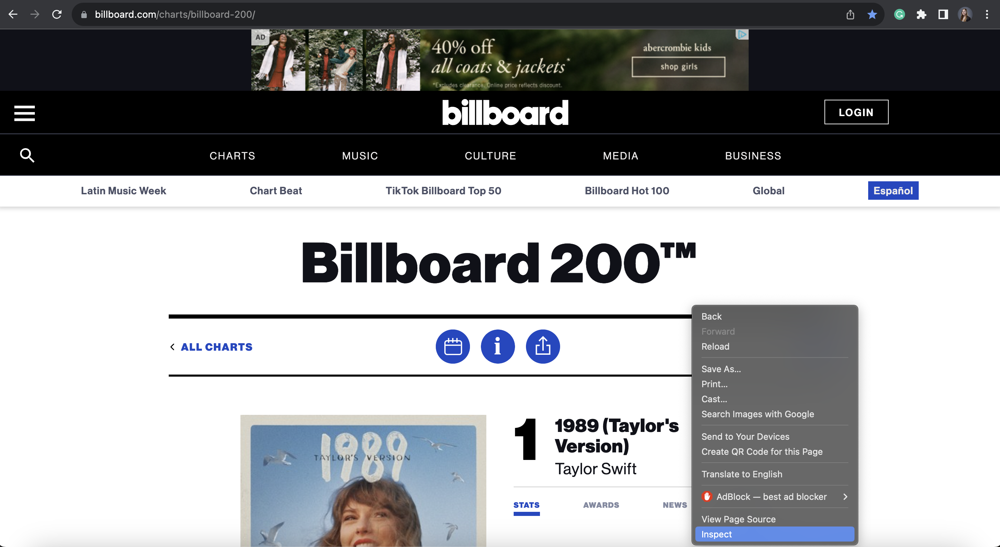

This will open a side panel:

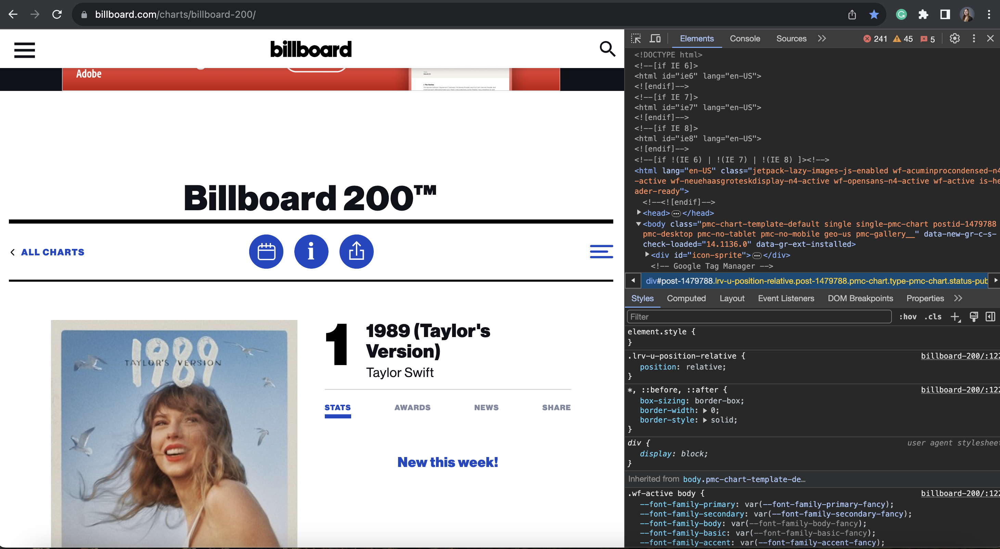

You'll see a **tabbed interface with various panels for inspecting different aspects of the web page**, such as Elements (HTML), Console (JavaScript), Network (network requests), and more.

Click on "Elements" or "Inspector" tab to view and manipulate the HTML and CSS of the page.

### And so what?

You might be wondering how we know which part of the code is responsible for which element on the web page.

To identify these relationships, **hover over elements in the "Elements" panel to highlight and select them on the web page**. You can see the HTML structure and CSS styles associated with the selected element and edit the code live to modify the displayed web page.

Here, we want to retrieve the data from the top 200 and create a table with the following information:


*   Ranking
*   Title
*   Artist / Author
*   New (Boolean)
*   Re-Entry (Boolean)
*   Last Week
*   Peak Position
*   Weeks on Chart

Thus, we need to identify which part of the code corresponds to the table on Billboard 200. To do so, we **hover over elements and progressively untoggle the elements leading to blue selection** on the parts we are interested in.

This leads us to this first row:

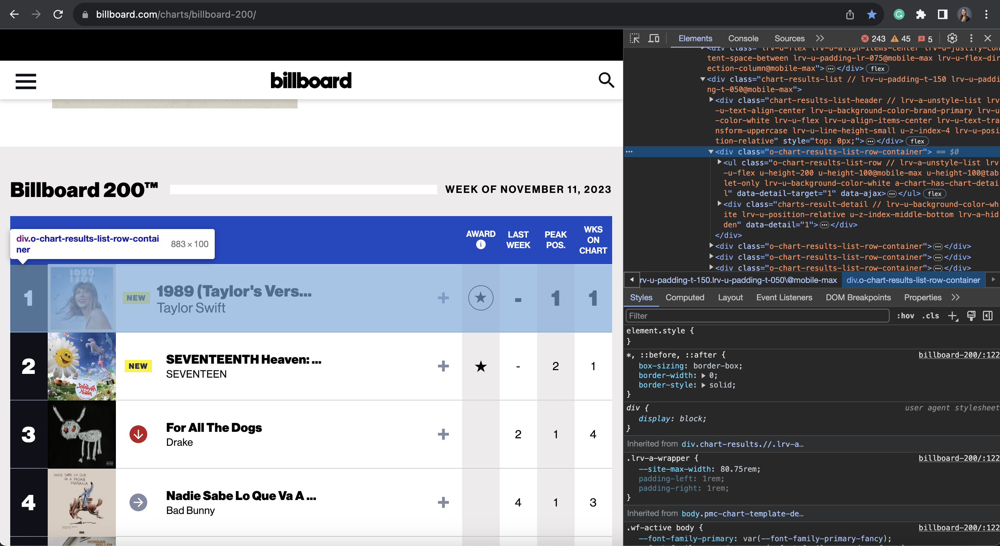

You can notice that all the rows are illustrated by a `<div class = "o-chart-results-list-row-container"> ... </div>`. The `<div>` tag defines a division or section of the HTML document. Here, all rows have the same `class` which enables them to have a similar styling.

## Requests & Beautiful Soup

Now that we've found something we want to retrieve, we need the tools to do so. The most common libraries to get data from a web page are `requests` and `BeautifulSoup`.

### Requests

This is a popular HTTP library that allows you to send HTTP requests and handle the responses.

In the example below, we send a GET request to 'https://www.billboard.com/charts/billboard-200/' and check if the response status code is 200. If it is, we can then use the content of this request and clean it with other libraries.

In [1]:
import requests
url = "https://www.billboard.com/charts/billboard-200/"
response = requests.get(url)

In [2]:
response.status_code

200

HTTP status codes are three-digit numbers returned by a server in response to a client's request made to the server. They provide information about the outcome of the request. Here are some common HTTP status codes:

*   **1xx (Informational):** These status codes indicate that the request was received, continuing process, or there's another interim response.
*   **2xx (Success - WHAT WE WANT):** These status codes indicate that the request was successfully received, understood, and accepted.
*   **3xx (Redirection):** These status codes indicate that further action needs to be taken in order to complete the request.
*   **4xx (Client Error):** These status codes indicate that the client seems to have made an error. The most famous error is Error *404 Not Found*.
*   **5xx (Server Error):** These status codes indicate that the server failed to fulfill a valid request. You might have experienced Error 503 when you tried to access a web page at the same time as too many other users and the server got overloaded.







b'<!DOCTYPE html>\n<!--[if IE 6]>\n<html id="ie6" lang="en-US">\n<![endif]-->\n<!--[if IE 7]>\n<html id="ie7" lang="en-US">\n<![endif]-->\n<!--[if IE 8]>\n<html id="ie8" lang="en-US">\n<![endif]-->\n<!--[if !(IE 6) | !(IE 7) | !(IE 8) ]><!-->\n<html lang="en-US">\n<!--<![endif]-->\n<head>\n\t<meta charset="UTF-8"/>\n\t<meta http-equiv="X-UA-Compatible" content="IE=edge,chrome=1">\n\t<meta name="theme-color" content="#ffffff">\n\t<meta name="viewport" content="width=device-width, initial-scale=1.0"/>\t\n<!-- Add to home screen for iOS -->\n<meta name="apple-mobile-web-app-status-bar-style" content="black-translucent">\n<link rel="apple-touch-icon" sizes="180x180" href="https://www.billboard.com/wp-content/themes/vip/pmc-billboard-2021/assets/app/icons/apple-touch-icon.png">\n\n<!-- Tile icons for Windows -->\n<meta name="msapplication-config" content="https://www.billboard.com/wp-content/themes/vip/pmc-billboard-2021/assets/app/browserconfig.xml">\n<meta name="msapplication-TileImage" c
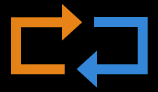

In [3]:
response.content

As you can tell, we don't want to keep the response under this format so we will use BeautifulSoup to decode it!

### BeautifulSoup

Beautiful Soup is a Python library for pulling data out of HTML and XML files. It provides tools for web scraping by transforming complex HTML documents into a navigable tree structure, making it easy to extract specific data with `find` and `find_all`.

In [5]:
from bs4 import BeautifulSoup

url = "https://www.billboard.com/charts/billboard-200/"
response = requests.get(url)

if not response.status_code == 200:
  pass

try:
    results_page = BeautifulSoup(response.content,'lxml')
    albums = results_page.find_all('div',{"class":"o-chart-results-list-row-container"}) #What we identified previously by inspecting the code

except:
  print('Error')

In [6]:
albums

[<div class="o-chart-results-list-row-container">
 <ul class="o-chart-results-list-row // lrv-a-unstyle-list lrv-u-flex u-height-200 u-height-100@mobile-max u-height-100@tablet-only lrv-u-background-color-white a-chart-has-chart-detail" data-ajax="" data-detail-target="1">
 <li class="o-chart-results-list__item // lrv-u-background-color-black lrv-u-color-white u-width-100 u-width-55@mobile-max u-width-55@tablet-only lrv-u-height-100p lrv-u-flex lrv-u-flex-direction-column lrv-u-flex-shrink-0 lrv-u-align-items-center lrv-u-justify-content-center lrv-u-border-b-1 u-border-b-0@mobile-max lrv-u-border-color-grey">
 <span class="c-label a-font-primary-bold-l u-font-size-32@tablet u-letter-spacing-0080@tablet">
 	
 	1
 </span>
 <div class="c-svg u-height-10@mobile-max u-width-10@mobile-max u-hidden@tablet">
 <svg height="10.157" width="10.157" xmlns="http://www.w3.org/2000/svg"><path d="M7.727 5.732H0V4.426h7.727L4.322.923 5.219 0l4.938 5.079-4.938 5.079-.9-.923z" data-name="Arrow" fill="#82

In [7]:
# Let's inspect the first song!
albums[0]

<div class="o-chart-results-list-row-container">
<ul class="o-chart-results-list-row // lrv-a-unstyle-list lrv-u-flex u-height-200 u-height-100@mobile-max u-height-100@tablet-only lrv-u-background-color-white a-chart-has-chart-detail" data-ajax="" data-detail-target="1">
<li class="o-chart-results-list__item // lrv-u-background-color-black lrv-u-color-white u-width-100 u-width-55@mobile-max u-width-55@tablet-only lrv-u-height-100p lrv-u-flex lrv-u-flex-direction-column lrv-u-flex-shrink-0 lrv-u-align-items-center lrv-u-justify-content-center lrv-u-border-b-1 u-border-b-0@mobile-max lrv-u-border-color-grey">
<span class="c-label a-font-primary-bold-l u-font-size-32@tablet u-letter-spacing-0080@tablet">
	
	1
</span>
<div class="c-svg u-height-10@mobile-max u-width-10@mobile-max u-hidden@tablet">
<svg height="10.157" width="10.157" xmlns="http://www.w3.org/2000/svg"><path d="M7.727 5.732H0V4.426h7.727L4.322.923 5.219 0l4.938 5.079-4.938 5.079-.9-.923z" data-name="Arrow" fill="#8289a1"></p

In [8]:
# We notice that the interesting information is mainly in the span texts so let's find all of them
all_spans = albums[0].find_all('span')

In [9]:
all_spans

[<span class="c-label a-font-primary-bold-l u-font-size-32@tablet u-letter-spacing-0080@tablet">
 	
 	1
 </span>,
 <span class="c-label a-no-trucate a-font-primary-s lrv-u-font-size-14@mobile-max u-line-height-normal@mobile-max u-letter-spacing-0021 lrv-u-display-block a-truncate-ellipsis-2line u-max-width-330 u-max-width-230@tablet-only u-font-size-20@tablet">
 	
 	Taylor Swift
 </span>,
 <span class="c-label a-font-primary-bold-l a-font-primary-m@mobile-max u-font-weight-normal@mobile-max lrv-u-padding-tb-050@mobile-max u-font-size-32@tablet">
 	
 	1
 </span>,
 <span class="c-label a-font-primary-bold-l a-font-primary-m@mobile-max u-font-weight-normal@mobile-max lrv-u-padding-tb-050@mobile-max u-font-size-32@tablet">
 	
 	1
 </span>,
 <span class="c-label a-font-primary-bold-l a-font-primary-m@mobile-max u-font-weight-normal@mobile-max lrv-u-padding-tb-050@mobile-max u-font-size-32@tablet">
 	
 	10
 </span>,
 <span class="c-label a-font-primary-bold-l a-font-primary-m@mobile-max u-fo

This contains almost everything we want to retrieve so let's clean it now and we'll go back to inspecting HTML later to find the album name !

In [10]:
first_album_ranking = all_spans[0].get_text()

In [11]:
first_album_ranking # We'd like 1 for the first album but what do you notice?

'\n\t\n\t1\n'

This isn't our final format unfortunately. To select only the number 1 corresponding to the album ranking, we'll use regular expressions (also called regex or regexp)!

## Regular expressions (aka regex or regexp)

Regular expressions (regex or regexp) are **sequences of characters that define a search pattern**. They are used for **pattern matching within strings**, allowing for sophisticated search and manipulation operations. In Python, the `re` module provides support for regular expressions, offering functions for pattern matching, search, and substitution in strings.

Common functions include:

* `re.search(pattern, string)`: Searches for the pattern in the string.
* `re.match(pattern, string)`: Matches the pattern only at the beginning of the string.
* `re.findall(pattern, string)`: Finds all occurrences of the pattern in the string.
* `re.sub(pattern, replacement, string)`: Replaces occurrences of the pattern with the replacement.

In [12]:
# Let's reformat first_album_ranking using regex
import re
first_regex = re.search(r'\d+', first_album_ranking) #d+ means that we only select the part of the string that is a sequence of digits

In [13]:
first_regex

<re.Match object; span=(4, 5), match='1'>

In [14]:
# We want to retrieve the actual number so we need to use .group()
first_regex.group()

'1'

Likewise, we identify that the album name is in the first h3 of the album container so we want to retrieve it and use regex to clean our data:

In [15]:
first_album_name_non_formatted = albums[0].find('h3').get_text()

In [16]:
first_album_name_non_formatted

"\n\n\t\n\t\n\t\t\n\t\t\t\t\t1989 (Taylor's Version)\t\t\n\t\n"

In [17]:
# We want to replace all \t\n by empty characters and we then use .strip() to retrieve only the core name
first_album_name = re.sub(r'[\t\n]+', ' ', first_album_name_non_formatted).strip()

In [18]:
first_album_name

"1989 (Taylor's Version)"

## Organizing data

Our goal is to create a Pandas DataFrame with the following columns:
* Ranking
* Title
* Author
* New
* Re-Entry
* Last Week
* Peak Position
* Weeks on Chart

This is the DataFrame we used during our last lecture together so you should be familiar with the format we are expecting :)

By playing with the HTML code, we discover that the information isn't located at the same position depending on whether the album is new in the billboard / re-entry or if it has been in the billboard for at least 2 weeks so far.

This is something that is always important to check but for a matter of time, we won't go through the whole process today and let you explore it instead when the project time will come!

In [19]:
# Function that combines everything to retrieve the data in a list
def get_albums():
    albums_list = list()
    import requests
    import re
    from bs4 import BeautifulSoup

    url = "https://www.billboard.com/charts/billboard-200/"
    response = requests.get(url)

    if not response.status_code == 200:
        return None

    try:
        results_page = BeautifulSoup(response.content,'lxml')
        albums = results_page.find_all('div',{"class":"o-chart-results-list-row-container"})

        for album in albums:

            all_spans = album.find_all('span')

            album_ranking_non_formatted = all_spans[0].get_text()
            album_ranking = re.search(r'\d+', album_ranking_non_formatted).group()

            album_name_non_formatted = album.find('h3').get_text()
            album_name = re.sub(r'[\t\n]+', ' ', album_name_non_formatted).strip()

            if re.sub(r'[\t\n]+', ' ', all_spans[1].get_text()).strip()=='NEW': # Case of new albums
                is_new = True
                is_reentry = False
                album_author_non_formatted = all_spans[3].get_text()
                album_author = re.sub(r'[\t\n]+', ' ', album_author_non_formatted).strip()
                last_week = '-'
                peak_position = album_ranking
                weeks_on_chart = 1

            elif re.sub(r'[\t\n]+', ' ', all_spans[1].get_text()).strip()=='RE- ENTRY': # Case of re-entries
                is_new = False
                is_reentry = True
                album_author_non_formatted = all_spans[3].get_text()
                album_author = re.sub(r'[\t\n]+', ' ', album_author_non_formatted).strip()
                last_week = '_'
                peak_position_non_formatted = all_spans[5].get_text()
                peak_position = re.search(r'\d+', peak_position_non_formatted).group()
                weeks_on_chart_non_formatted = all_spans[6].get_text()
                weeks_on_chart = re.search(r'\d+', weeks_on_chart_non_formatted).group()


            else: # Albums that have been in the billboard 200 for at least 2 weeks now
                is_new = False
                is_reentry = False
                album_author_non_formatted = all_spans[1].get_text()
                album_author = re.sub(r'[\t\n]+', ' ', album_author_non_formatted).strip()
                last_week_non_formatted = all_spans[2].get_text()
                last_week = re.search(r'\d+', last_week_non_formatted).group()
                peak_position_non_formatted = all_spans[3].get_text()
                peak_position = re.search(r'\d+', peak_position_non_formatted).group()
                weeks_on_chart_non_formatted = all_spans[4].get_text()
                weeks_on_chart = re.search(r'\d+', weeks_on_chart_non_formatted).group()

            albums_list.append((album_ranking,album_name,album_author, is_new, is_reentry, last_week, peak_position, weeks_on_chart))
        return albums_list
    except:
        return None

In [21]:
import pandas as pd
df = pd.DataFrame(get_albums(),columns = ['Ranking','Title','Author','New','Re-Entry','Last Week','Peak Position', 'Weeks on Chart'])

In [22]:
df.head(10)

,Ranking,Title,Author,New,Re-Entry,Last Week,Peak Position,Weeks on Chart
0,1,1989 (Taylor's Version),Taylor Swift,False,False,1,1,10
1,2,One Thing At A Time,Morgan Wallen,False,False,5,1,44
2,3,For All The Dogs,Drake,False,False,6,1,13
3,4,Pink Friday 2,Nicki Minaj,False,False,3,1,4
4,5,Midnights,Taylor Swift,False,False,9,1,63
5,6,Lover,Taylor Swift,False,False,11,1,228
6,7,SOS,SZA,False,False,13,1,56
7,8,Stick Season,Noah Kahan,False,False,18,3,58
8,9,Zach Bryan,Zach Bryan,False,False,20,1,19
9,10,Folklore,Taylor Swift,False,False,21,1,180


## Export the data

You might want to export the data to a csv file for instance, in order to keep the data from a specific week accessible even though we aren't that week anymore.

To do so, you can use the `to_csv` function.

In [23]:
# If I want to save it locally, I'm just gonna use the following code
df.to_csv('billboard_200.csv')

In [ ]:
# If, however, I prefer to save it on my Drive, I can tell Colab the path to follow (only for Google Colab users)
from google.colab import drive

drive.mount('/content/drive')

path = '/content/drive/My Drive/billboard_200.csv'

with open(path, 'w', encoding = 'utf-8-sig') as f:
  df.to_csv(f)

If you're a big fan of GSheets and need to do a lot of formatting on data in GSheets, this [article](https://max-coding.medium.com/exporting-pandas-dataframe-from-google-colab-notebook-to-google-spreadsheet-9de9b1d1bd1d#:~:text=Export%20to%20CSV%20file%20using,CSV%20file%20from%20local%20drive) might interest you on how to use Python in Google Colab to style a spreadsheet using `gspread`.

## Project : Your turn 💪

1. Choose a web page you'd like to retrieve information from
2. Inspect it and decide which information exactly you want
3. Create a DataFrame with the data you've scrapped
4. Export your data as a csv file and share that csv file on Slack along with a small blurb explaining from which web page it comes and why you chose this data (2-4 lines is enough)

**Bonus:** Once your DataFrame has been created, you can do a quick analysis of your data and share it with us on Slack.

If there is anything you wanna do and aren't sure how to do it, ping us and we'll be happy to help you!

In [ ]:
# YOUR CODE HERE